In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# import os
# import sys
# # import random
from skimage.io import imsave
# from skimage.transform import resize
# from skimage import feature
# from skimage.filters import sobel
# from skimage.morphology import watershed

import skimage
import torch
import torch.nn as nn
import torch.utils.data
import torch.nn.functional as F
from torch.autograd import Variable

# from pathlib import Path
import nibabel as nib
# from sklearn import preprocessing
# from skimage import transform
# import cv2

from utils.display_utils import image_grid, image_gray, rebuild
from utils.process_test_img import process_test_img
from utils.prep_test_set import make_test_set
from utils.neuron_dataset import Neuron_dataset
from networks.unet_res import Unet_res

In [2]:
test_img = process_test_img('data/train-input.tif')#'test-input.tif')


In [3]:
img = test_img.mod_image()
img.shape

(1152, 1152, 102)

Pass chunks of 36,36,30 for a total of 102.  Remove top and bottom at the end.

:36, 36:72,72:102

In [4]:
# test_set = make_test_set(img[:,:,:36],6)
# test_set = make_test_set(img[:,:,36:72],6)
test_set = make_test_set(img[:,:,72:102],5)

dataset size:  81920


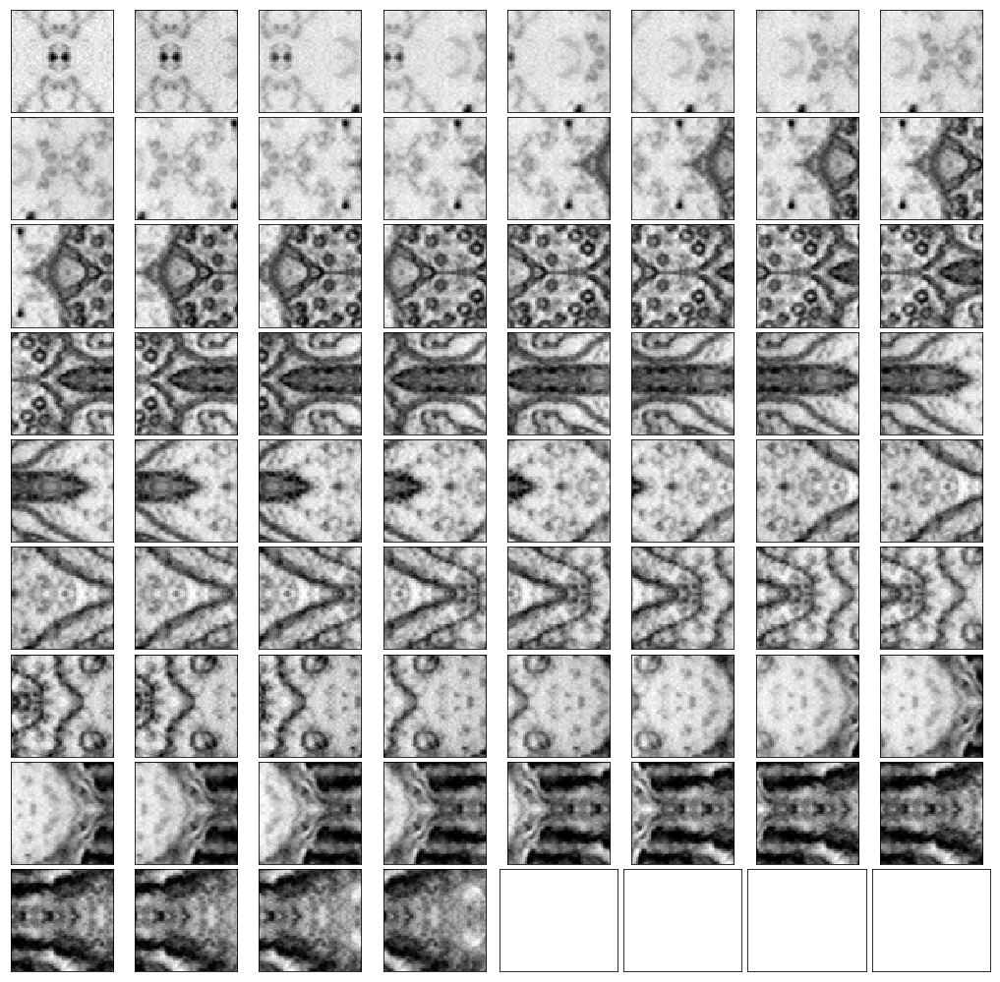

In [5]:
image_grid(test_set[:68])

# Run predictions


In [6]:
path_to_experiment = 'experiments/unet_res/'
saved_name = 'temp_best.pth'
save_as = 'unet_res'

In [7]:
model = Unet_res()
state_dict = torch.load(path_to_experiment+saved_name)
model.load_state_dict(state_dict)
model.cuda()

Unet_res(
  (down1): Conv_block(
    (conv1): Sequential(
      (0): Conv3d(1, 16, kernel_size=(3, 3, 1), stride=(1, 1, 1), padding=(1, 1, 0))
      (1): ReLU()
      (2): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (conv2): Sequential(
      (0): Conv3d(16, 16, kernel_size=(3, 3, 1), stride=(1, 1, 1), padding=(1, 1, 0))
      (1): ReLU()
      (2): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (down2): Res_block(
    (conv_3x3x1): Conv3d(16, 16, kernel_size=(3, 3, 1), stride=(1, 1, 1), padding=(1, 1, 0))
    (bn1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_3x3x3_1): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (bn2): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_3x3x3_2): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (bn3): BatchNorm3d(16

In [8]:
batch_size = 32
neuron_test = Neuron_dataset(test_set,train=False,masks=None, transform=False)
test_loader = torch.utils.data.DataLoader(dataset=neuron_test, 
                                           batch_size=batch_size, 
                                           shuffle=False)

In [9]:
model.eval()
res = []
count =0
for images in test_loader:
    images = Variable(images.cuda())
    outputs = model(images)
    size = outputs.shape[0]
    if size==32:
        for i in range(32):
            res.append(F.sigmoid(outputs)[i].squeeze().data.cpu().numpy())
    else:
        for i in range(64):
            res.append(F.sigmoid(outputs)[i].squeeze().data.cpu().numpy())


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [10]:
len(res)

81920

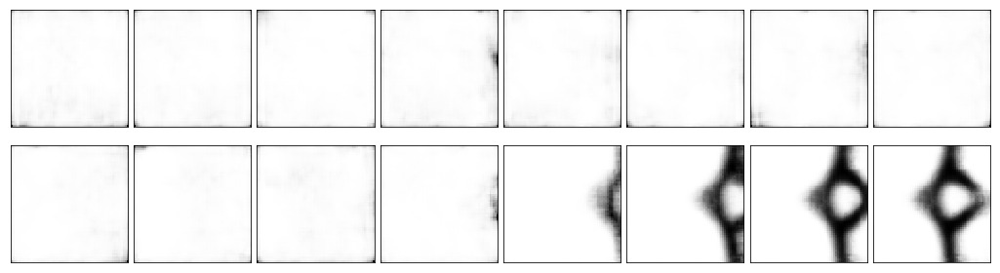

In [11]:
image_grid(res[:18],True,2,8,(18,5))

In [12]:
#pass number of layers: 30 or 36
res_ = rebuild(res, 30)

81920
81920


In [13]:
res_.shape

(1024, 1024, 30)

In [14]:
res_= np.rollaxis(res_,2,0)
# take first off the first chunk, and the last layer off the last chunk
#res_[1:,:,:], res_[:,:,:], res_[:30,:,:] = 100 in z direction
skimage.io.imsave('experiments/unet_res/last29_thresh_3.tif', res_[:29,:,:])

# This section is to use 3d view

In [13]:
res_= np.rollaxis(res_,2,0)

In [14]:
res_.shape

(30, 1024, 1024)

In [18]:
# imsave(path_to_experiment+save_as+'.tif',res_[1:,:,:])

arr = np.eye(4)*[1,1,5,1]
cube = res_[1:,:,:]
arr_im = nib.Nifti1Image(cube, arr)
file_string = path_to_experiment+save_as+'.nii.gz'
nib.save(arr_im, file_string)

In [20]:
res_= np.rollaxis(res_,0,3)

In [ ]:
image_gray(res_[:,:,24],10)

# this is the end of 3d view section

In [22]:
tt = skimage.io.imread('experiments/unet_res/last30_thresh_3.tif')
tt.shape

(30, 1024, 1024)

In [23]:
res_.shape

(1024, 1024, 30)

<Figure size 432x288 with 0 Axes>

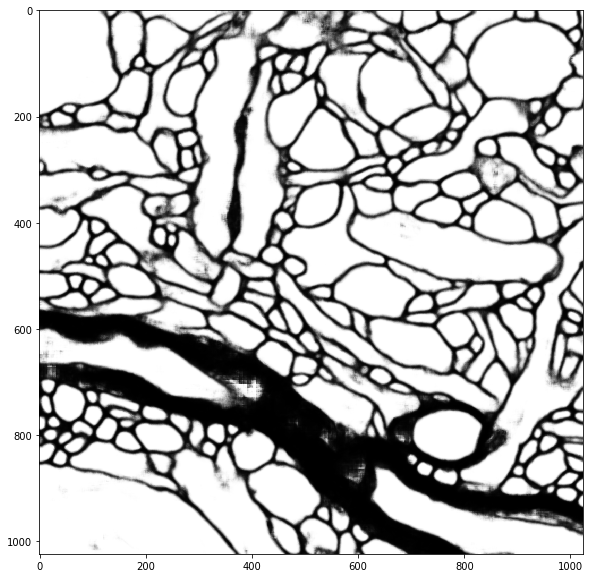

<Figure size 432x288 with 0 Axes>

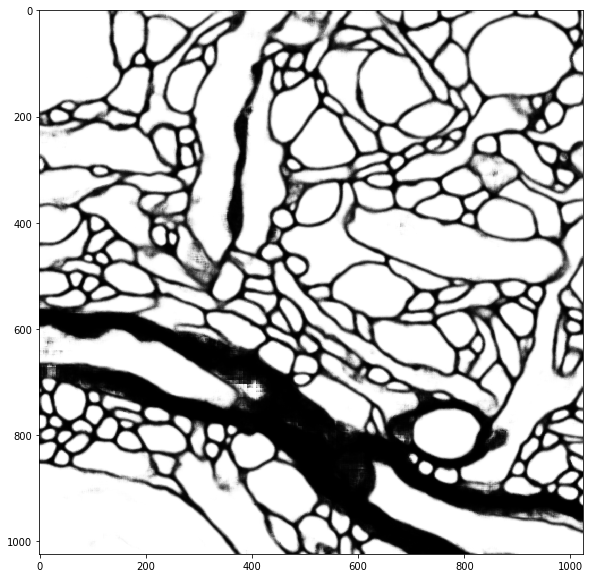

<Figure size 432x288 with 0 Axes>

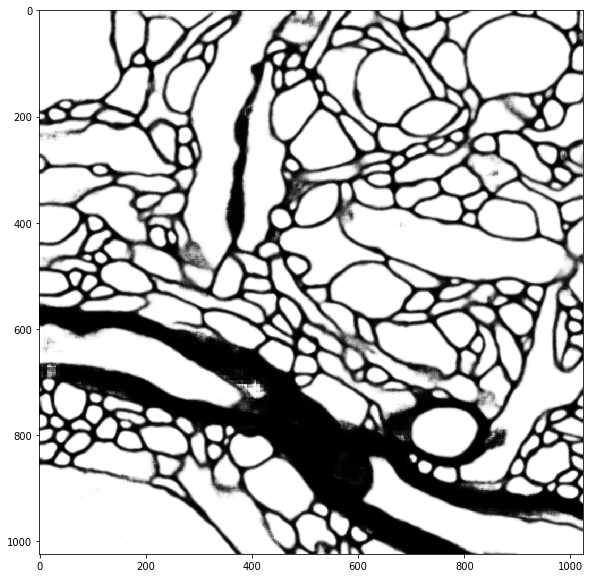

<Figure size 432x288 with 0 Axes>

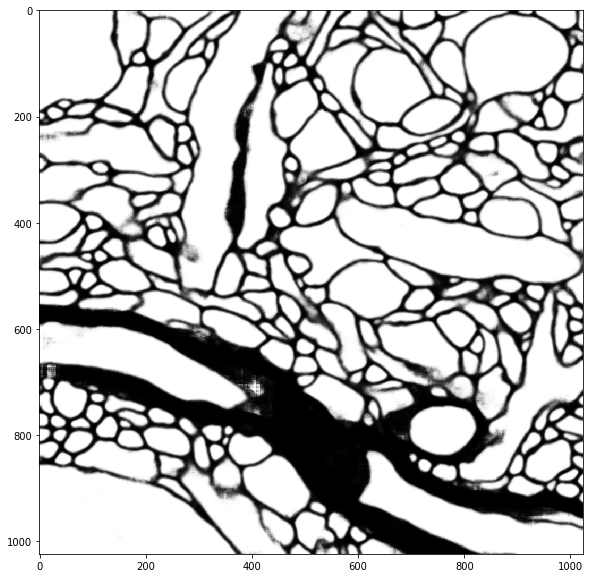

<Figure size 432x288 with 0 Axes>

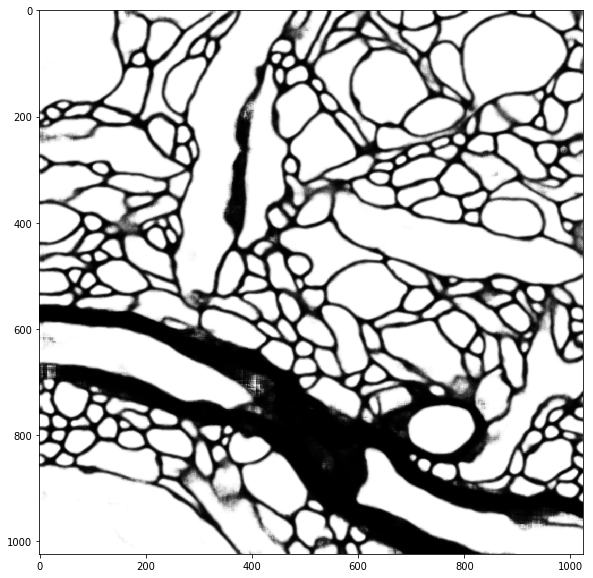

<Figure size 432x288 with 0 Axes>

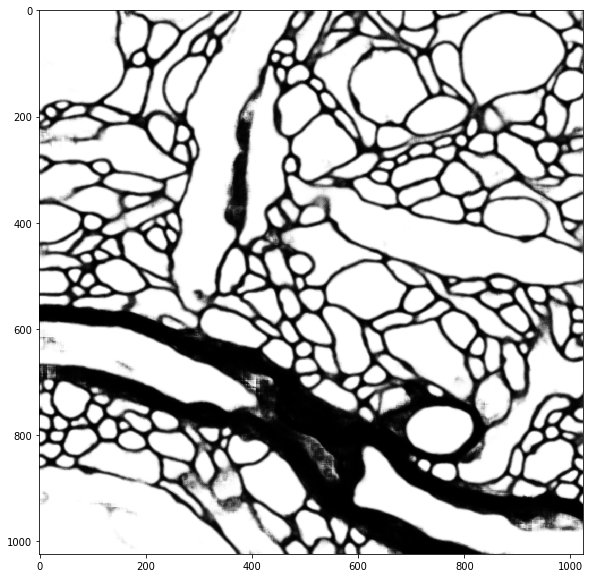

<Figure size 432x288 with 0 Axes>

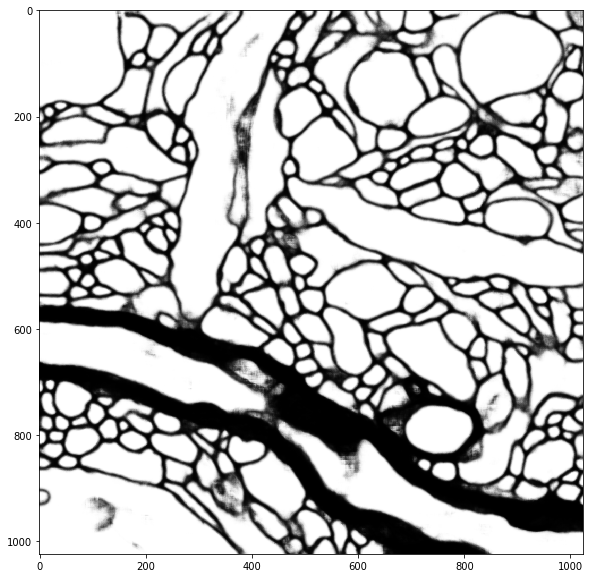

<Figure size 432x288 with 0 Axes>

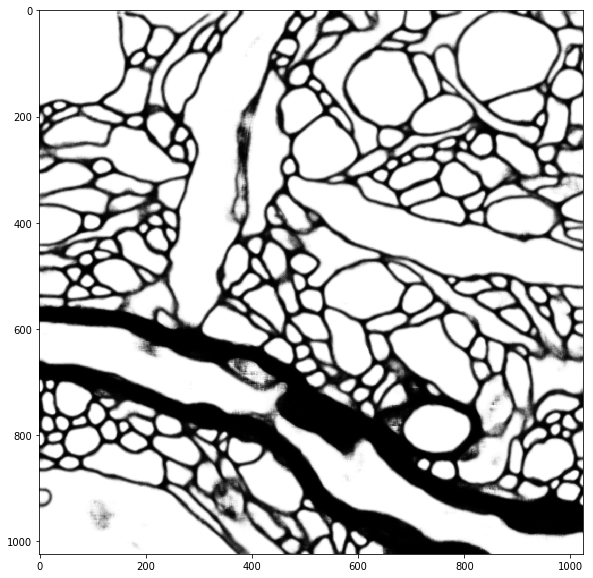

<Figure size 432x288 with 0 Axes>

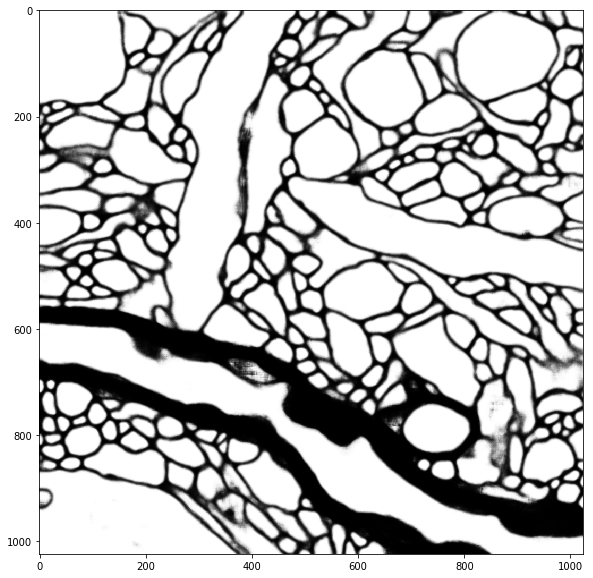

<Figure size 432x288 with 0 Axes>

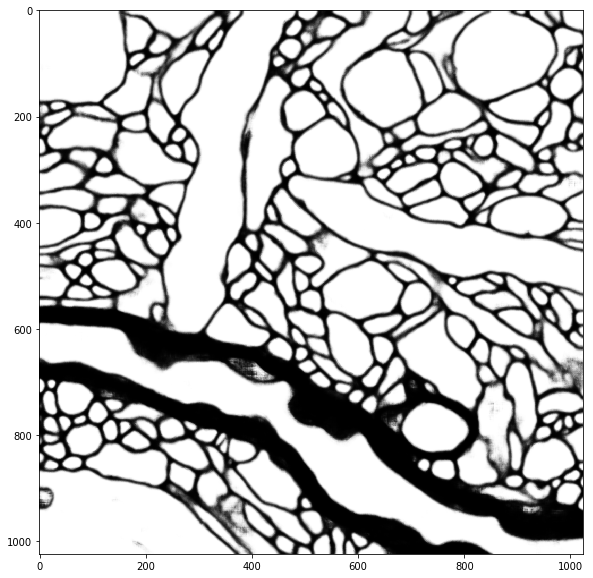

<Figure size 432x288 with 0 Axes>

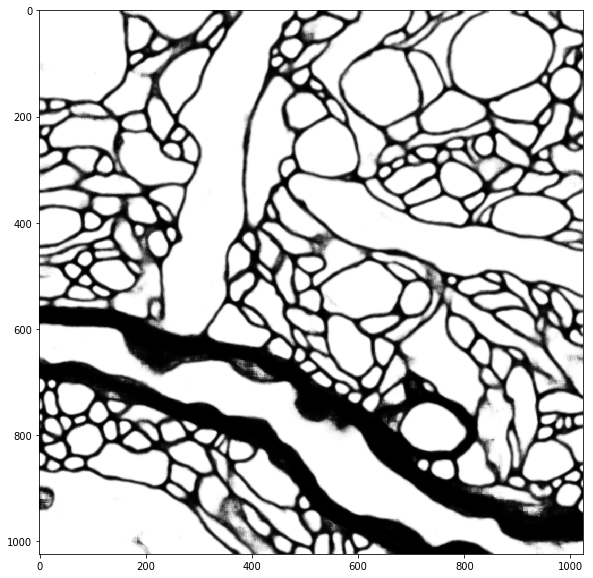

<Figure size 432x288 with 0 Axes>

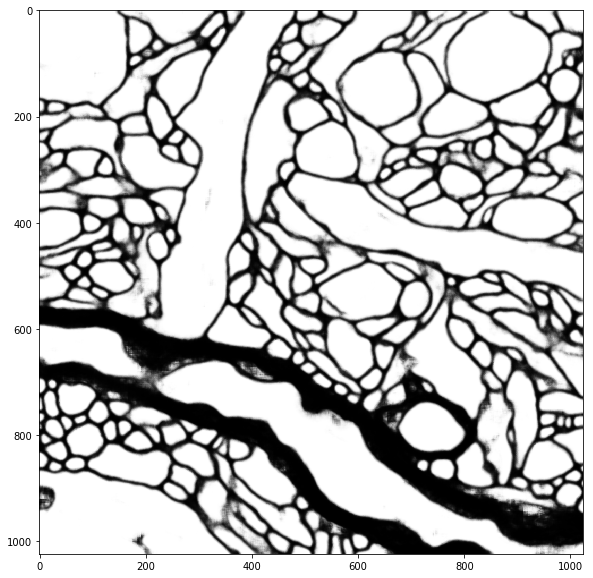

<Figure size 432x288 with 0 Axes>

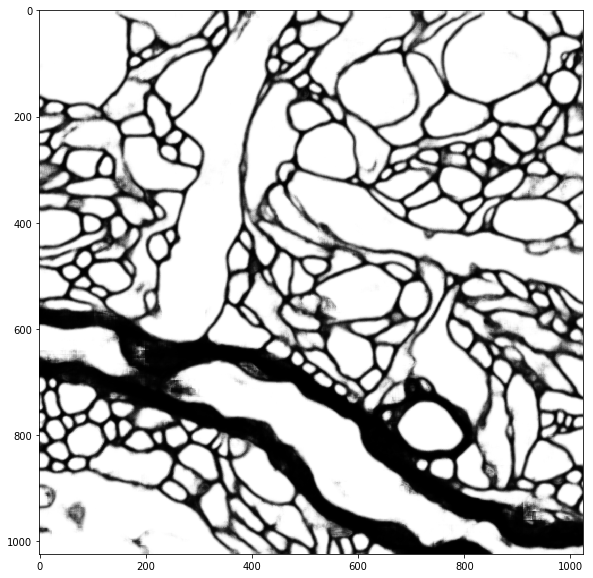

<Figure size 432x288 with 0 Axes>

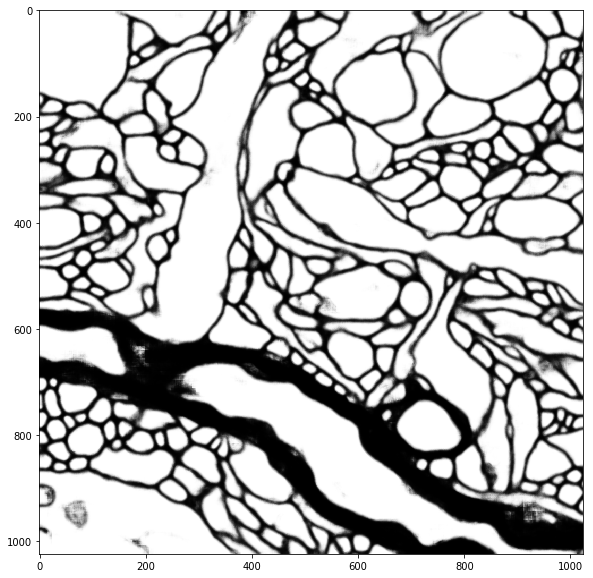

<Figure size 432x288 with 0 Axes>

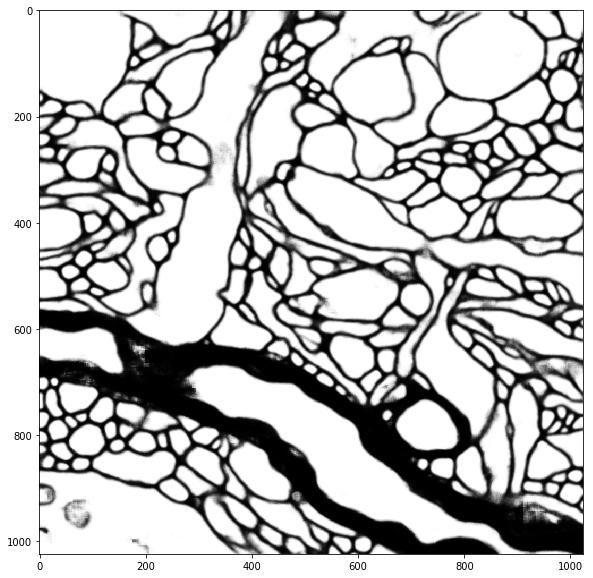

<Figure size 432x288 with 0 Axes>

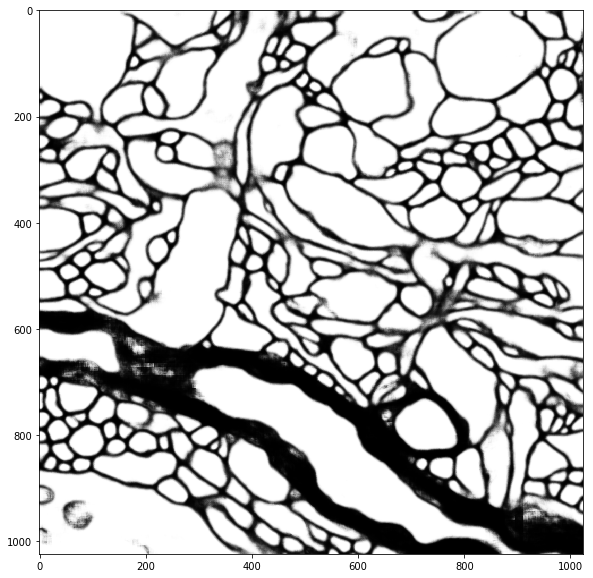

<Figure size 432x288 with 0 Axes>

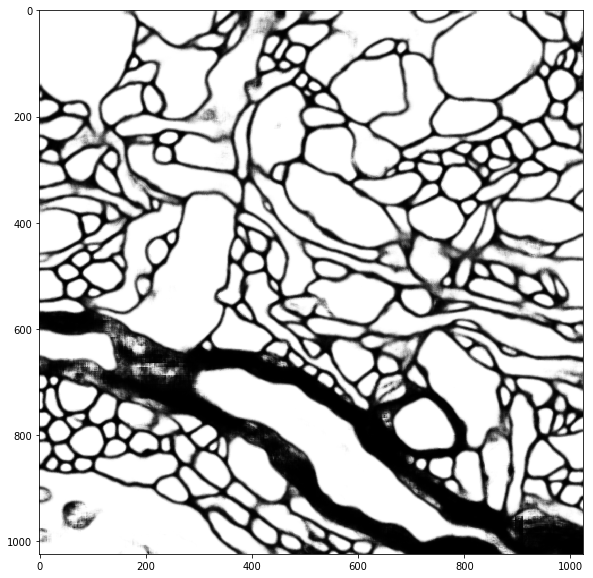

<Figure size 432x288 with 0 Axes>

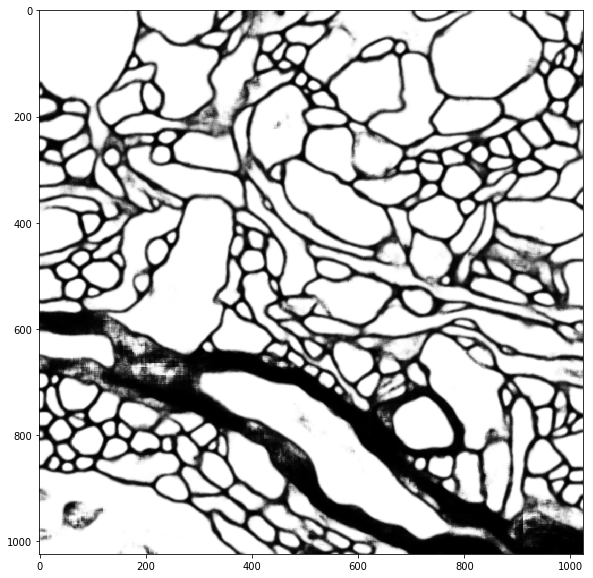

<Figure size 432x288 with 0 Axes>

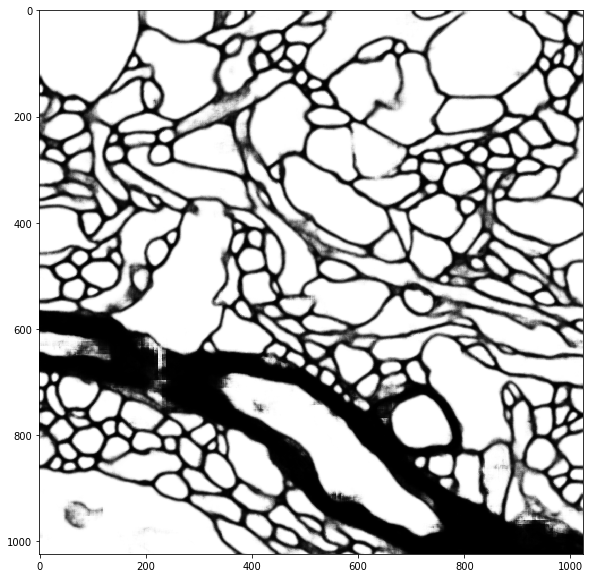

<Figure size 432x288 with 0 Axes>

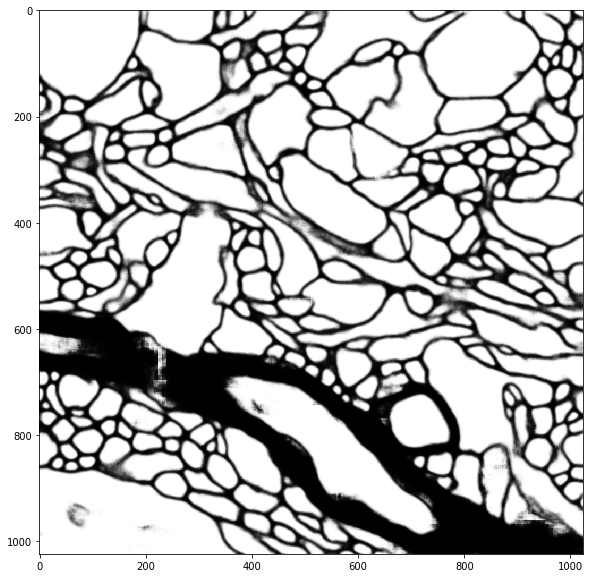

<Figure size 432x288 with 0 Axes>

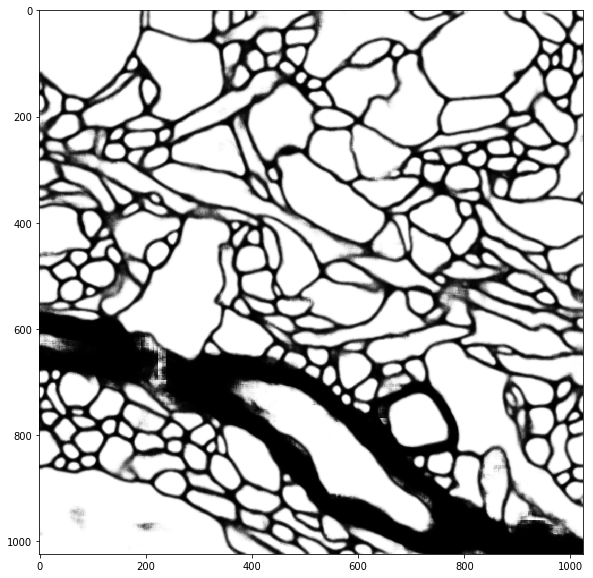

<Figure size 432x288 with 0 Axes>

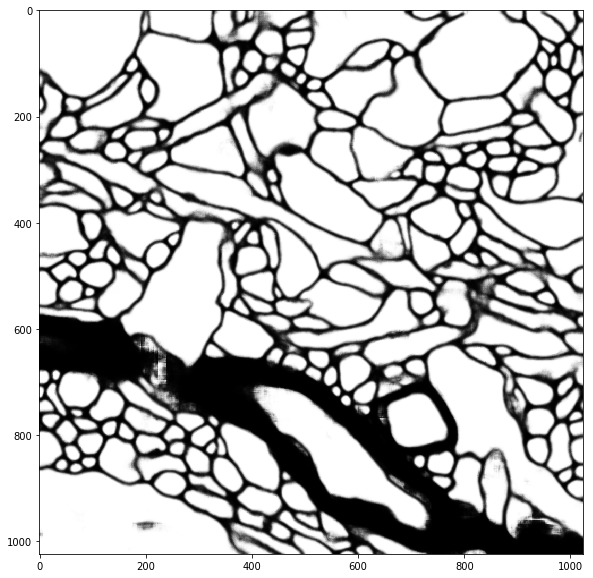

<Figure size 432x288 with 0 Axes>

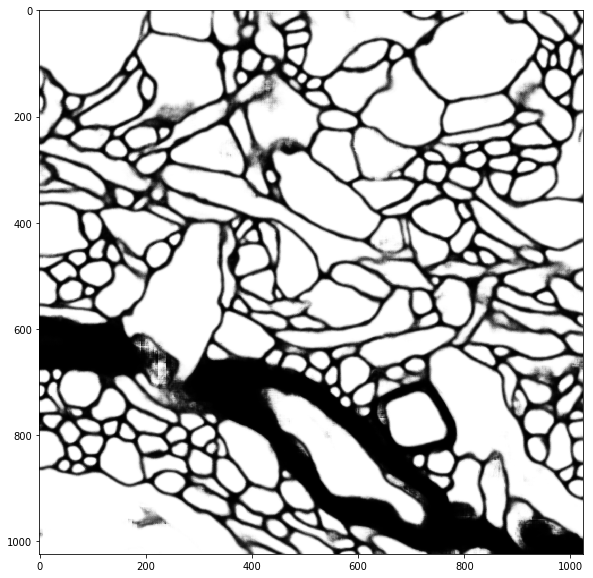

<Figure size 432x288 with 0 Axes>

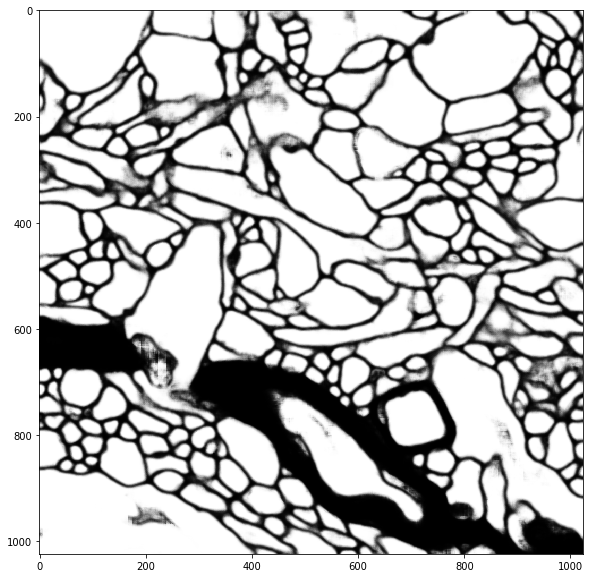

<Figure size 432x288 with 0 Axes>

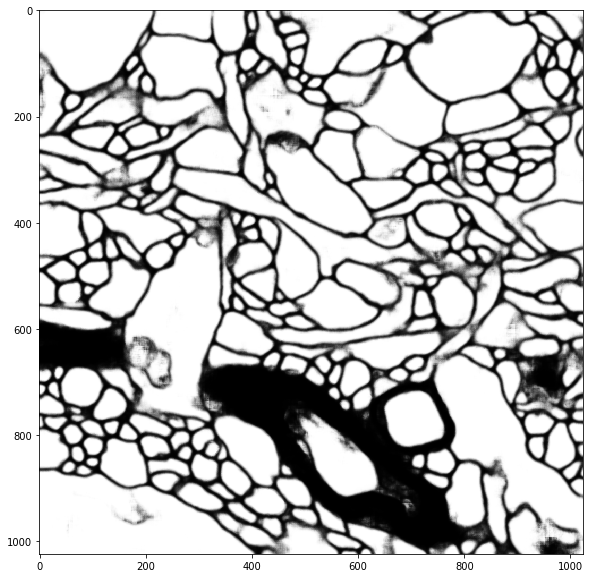

<Figure size 432x288 with 0 Axes>

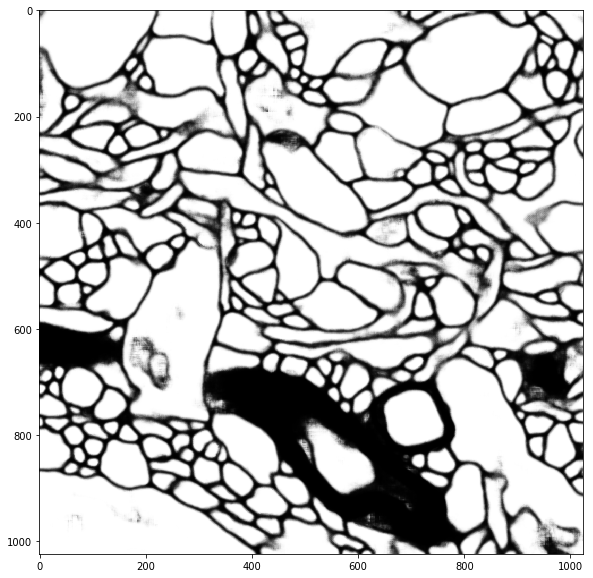

<Figure size 432x288 with 0 Axes>

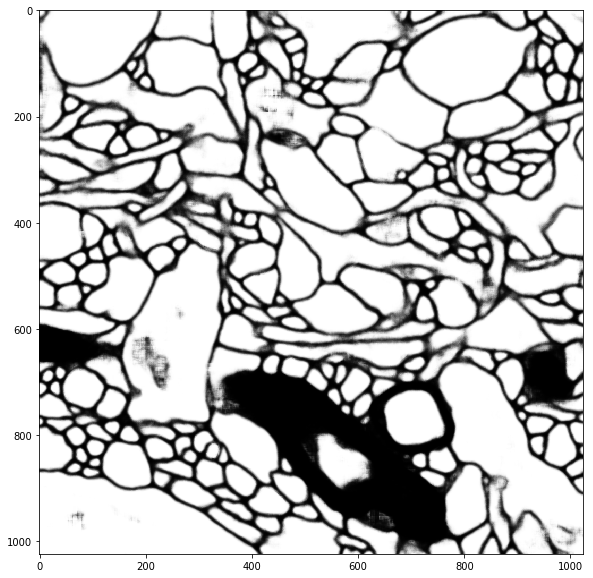

<Figure size 432x288 with 0 Axes>

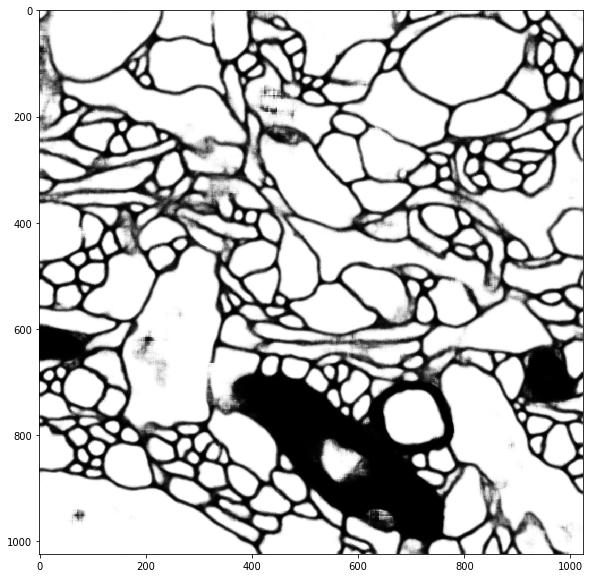

<Figure size 432x288 with 0 Axes>

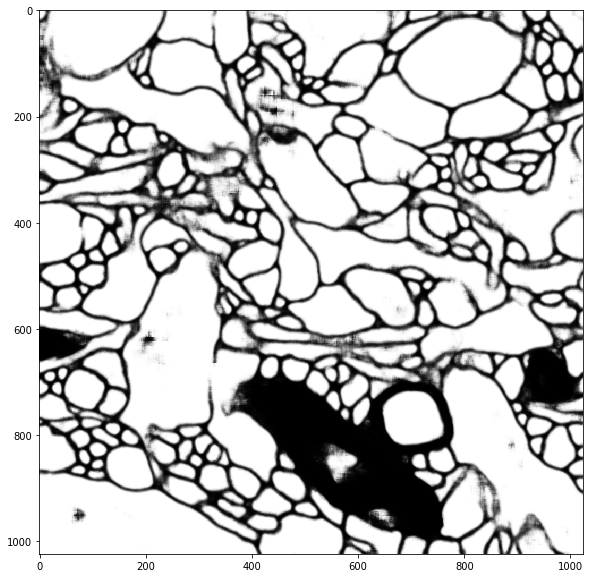

<Figure size 432x288 with 0 Axes>

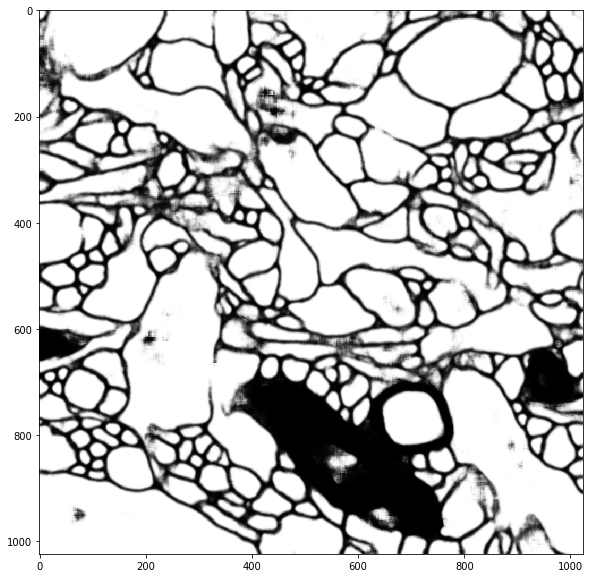

In [16]:
res_= np.rollaxis(res_,0,3)
for i in range(30):
    image_gray(res_[:,:,i],10)

<Figure size 432x288 with 0 Axes>

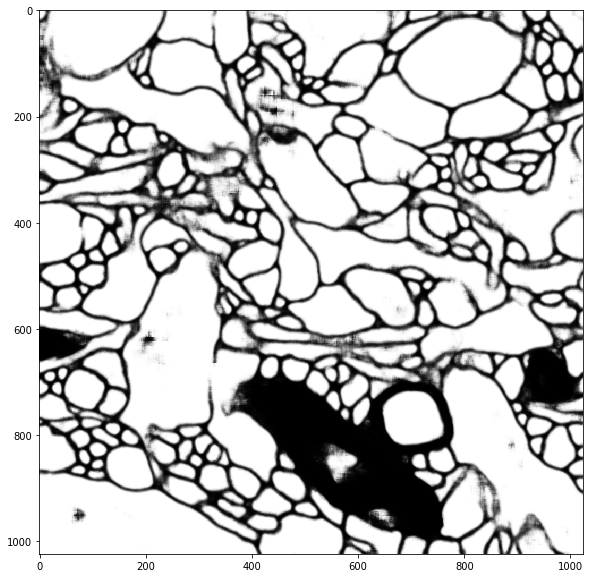

In [20]:
image_gray(res_[:,:,28],10)

<Figure size 432x288 with 0 Axes>

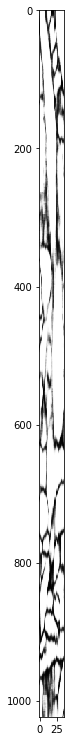

In [18]:
image_gray(res_[0,:,:],13)

<Figure size 432x288 with 0 Axes>

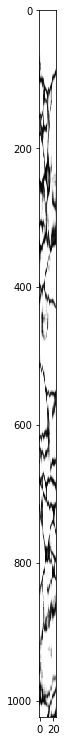

In [21]:
image_gray(res_[0,:,:],13)

/opt/conda/lib/python3.7/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/opt/conda/lib/python3.7/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


<Figure size 432x288 with 0 Axes>

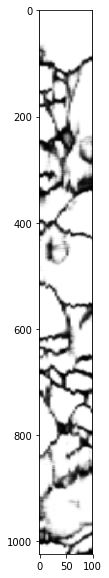

In [22]:
img_a = skimage.transform.resize(res_[0,:,:], (1024,100))
image_gray(img_a)

<Figure size 432x288 with 0 Axes>

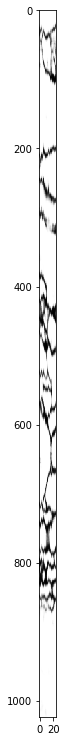

In [23]:
image_gray(res_[:,0,:],13)

<Figure size 432x288 with 0 Axes>

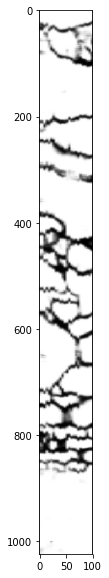

In [24]:
img_a = skimage.transform.resize(res_[:,0,:], (1024,100))
image_gray(img_a)

In [25]:
res_ = np.rollaxis(res_,2,0)
skimage.io.imsave('experiments/unet_res/top23.tif', res_[1:,:,:])

In [26]:
res_.shape

(24, 1024, 1024)

In [33]:
skimage.io.imsave('experiments/unet_add/top23.tif', res_[1:,:,:])

In [46]:
im1 = skimage.io.imread('experiments/unet_res/top23.tif')

In [47]:
im1.shape

(23, 1024, 1024)

In [48]:
im1_ = np.rollaxis(im1, 0,3)

In [49]:
im1_.shape

(1024, 1024, 23)

<Figure size 432x288 with 0 Axes>

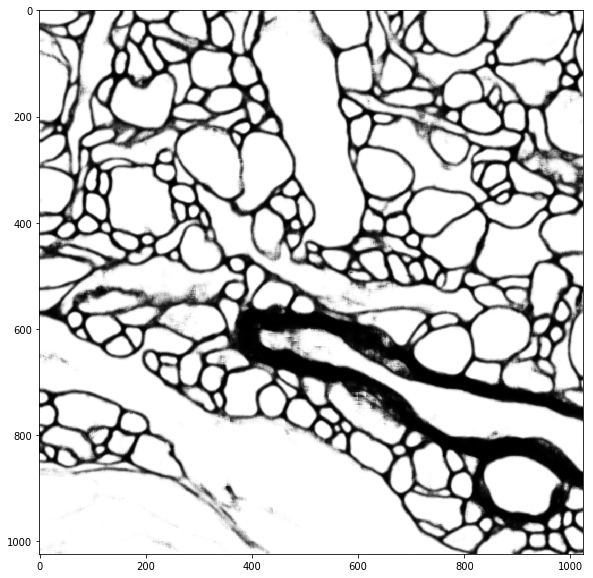

In [50]:
image_gray(im1_[:,:,0])

<Figure size 432x288 with 0 Axes>

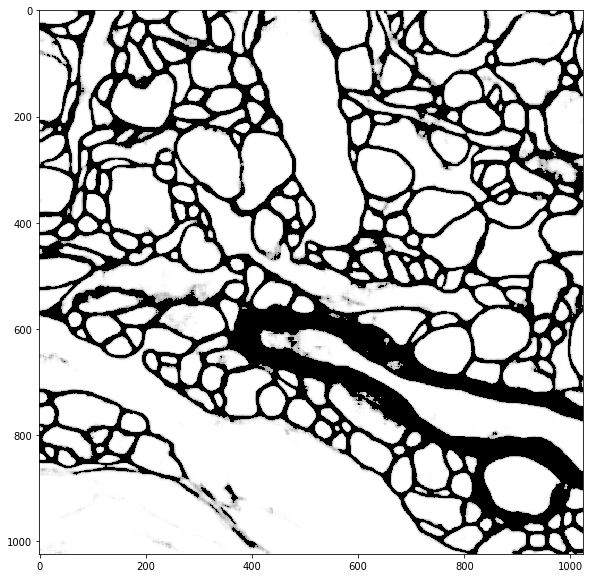

In [54]:
img=im1_[:,:,0]
img[img <= .6]=0
# img[img >.1]=1
image_gray(img)

In [54]:
from skimage.filters import threshold_isodata


In [55]:
img=im1_[:,:,0]

In [73]:
img[img <= .2]=0
img[img >.2]=1

<Figure size 432x288 with 0 Axes>

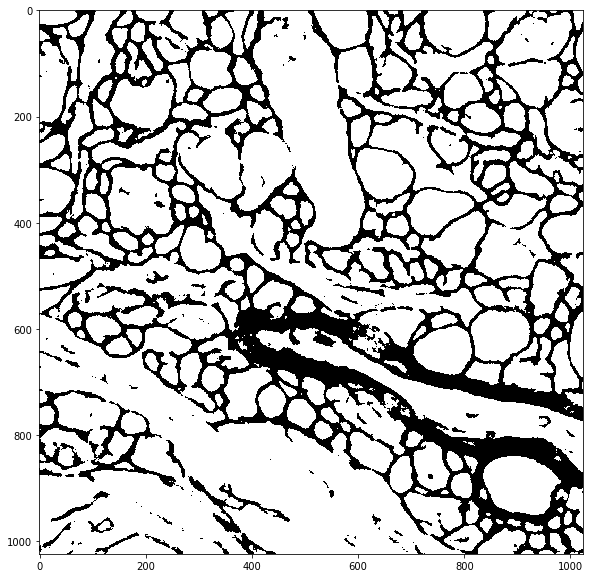

In [74]:
image_gray(img)

In [75]:
res_.shape

(24, 1024, 1024)

In [76]:
res_[res_ <=.2]=0
res_[res_ >.2] =1

In [77]:
# res_ = np.rollaxis(res_,2,0)
skimage.io.imsave('experiments/unet_add/top23_thresh.tif', res_[1:,:,:])